# Lung Segmentation and cropping

In [1]:
import glob
import pandas  as pd
import numpy   as np
import nibabel as nib
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow.keras import datasets, layers, models

from zipfile import ZipFile
from shutil import copyfile, copyfileobj
import gzip

from IPython.display import clear_output
import cv2
import os
from pylab import rcParams
import PIL
from PIL import Image
import scipy

from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, MeanShift
import imgaug as ia
import imgaug.augmenters as iaa

print("Version: ", tf.__version__)
print("Eager mode: ", tf.executing_eagerly())
print("GPU is", "available" if tf.config.experimental.list_physical_devices("GPU") else "NOT AVAILABLE")

Version:  2.10.0
Eager mode:  True
GPU is available


In [2]:
import sys
import random
import warnings

import math
import seaborn as sns; sns.set()
from keras.callbacks import Callback
from keras.losses import binary_crossentropy
from tqdm import tqdm_notebook, tnrange
from itertools import chain
from skimage.io import imread, imshow, concatenate_images
from skimage.transform import resize
from skimage.morphology import label

from keras.models import Model, load_model
from keras.layers import Input, BatchNormalization, Activation, Dense, Dropout
from keras.layers.core import Lambda, RepeatVector, Reshape
from keras.layers.convolutional import Conv2D, Conv2DTranspose
from keras.layers.pooling import MaxPooling2D, GlobalMaxPool2D
from keras.layers.merge import concatenate, add
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, LearningRateScheduler
from keras.optimizers import Adam
from keras.preprocessing.image import ImageDataGenerator # , array_to_img, img_to_array,load_img
from keras import backend as K
import joblib
import gc
import segmentation_models as sm

Segmentation Models: using `keras` framework.


* Extracting files here

In [3]:
# Read and examine metadata
raw_data = pd.read_csv('../input/covid19-ct-scans/metadata1.csv')
raw_data.head(5)

,ct_scan,lung_mask,infection_mask,lung_and_infection_mask
0,../input/covid19-ct-scans/ct_scans/coronacases...,../input/covid19-ct-scans/lung_mask/coronacase...,../input/covid19-ct-scans/infection_mask/coron...,../input/covid19-ct-scans/lung_and_infection_m...
1,../input/covid19-ct-scans/ct_scans/coronacases...,../input/covid19-ct-scans/lung_mask/coronacase...,../input/covid19-ct-scans/infection_mask/coron...,../input/covid19-ct-scans/lung_and_infection_m...
2,../input/covid19-ct-scans/ct_scans/coronacases...,../input/covid19-ct-scans/lung_mask/coronacase...,../input/covid19-ct-scans/infection_mask/coron...,../input/covid19-ct-scans/lung_and_infection_m...
3,../input/covid19-ct-scans/ct_scans/coronacases...,../input/covid19-ct-scans/lung_mask/coronacase...,../input/covid19-ct-scans/infection_mask/coron...,../input/covid19-ct-scans/lung_and_infection_m...
4,../input/covid19-ct-scans/ct_scans/coronacases...,../input/covid19-ct-scans/lung_mask/coronacase...,../input/covid19-ct-scans/infection_mask/coron...,../input/covid19-ct-scans/lung_and_infection_m...


* img_size is the preferred image size to which the image is to be resized

In [4]:
img_size = 512

In [5]:
def clahe_enhancer(test_img, demo):
    '''* Used (CLAHE) Contrast Limited Adaptive Histogram Equalization to enhance the contrast of the images since medical images suffer a lot from the contrast problems.
    * Here Clip limit and the grid size are the hyperparameters to tune, generally clip limit should be between 2 to 4 as higher clip limit won't clip most of the histogram and treat it as AHE.
    * Higher clip limit might not even prevent the image from overamplifying the noise (the core advantage the CLAHE gives over AHE)
    * Demo is a boolean variable, if 1 then giving the ability to plot the before and image after enhancement along with their respective histogram plots.'''
    test_img = test_img*255
    test_img = np.uint8(test_img)
    test_img_flattened = test_img.flatten()

    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
    clahe_image = clahe.apply(test_img)
    clahe_image_flattened = clahe_image.flatten()

    if demo == 1:

        fig = plt.figure()
        rcParams['figure.figsize'] = 10,10

        plt.subplot(2, 2, 1)
        plt.imshow(test_img, cmap='bone')
        plt.title("Original image")

        plt.subplot(2, 2, 2)
        plt.hist(test_img_flattened)
        plt.title("Histogram of Original Image")

        plt.subplot(2, 2, 3)
        plt.imshow(clahe_image, cmap='bone')
        plt.title("CLAHE Enhanced Image")

        plt.subplot(2, 2, 4)
        plt.hist(clahe_image_flattened)
        plt.title("Histogram of CLAHE Enhanced Image")

    return(clahe_image)

* The images possess a lot of black space containing nothing and parts in which we are not interested like diaphragm below lungs. They will take the valuable RAM and also the unnecessary convolutions (computing power)
* A possible solution is cropping the images and taking out the Region Of Interest (ROI) as per problem statement and use case.
* Other pros are that we can now have greater area of ROI in the same resolution.
* For cropping, though we can slice the rows and columns using trial and error but that process would be limited to this dataset only. 
* If I input the same images with the lungs translated vertically a bit, the above technique would fail miserably and would rather crop the lungs too.
* So, a more better approach is to draw contours over the image and then cropping out the rectangle with the biggest contour with the largest area. 
* The contour (largest closed boundary) with the largest area would be the contour covering both the lungs.
* This will require thresholding as a prior step. After plotting the histogram of the images, the images were found near bimodal i.e. roughly two peaks. So, used the Otsu's method of binarization
* In global thresholding, we can use an arbitrary chosen value as a threshold. In contrast, Otsu's method avoids having to choose a value and determines it automatically and returns it.

* Another important point is while cropping a CT scan we have to make sure that its corresponding segmentation map is also cropped by same limits otherwise pixel level labeling will go wrong and the model might map a good area with an infectious area and vice versa which we don't want.
* So, in order to preserve the 4 end points, I am using a list by the name "points" for the same.

In [6]:
def cropper(test_img, demo):
    ''' The cropper is a way to remove balck space in "uninteresting" areas of an image so we can
    save on computing and memory for doing our analysis.  We are only in this instance interested
    in the lungs for example."'''

    test_img = test_img*255
    test_img = np.uint8(test_img)

    ret, thresh = cv2.threshold(test_img, 50, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU) 
    ret, thresh = cv2.threshold(test_img, ret, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU) 

    contours,hierarchy = cv2.findContours(test_img, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    areas = [cv2.contourArea(c) for c in contours]

    x = np.argsort(areas)

    max_index = x[x.size - 1]
    cnt1=contours[max_index]
    second_max_index = x[x.size - 2]
    cnt2 = contours[second_max_index]
    
    cropped_image_flattened = test_img.flatten()


    # max_index = np.argmax(areas)
    # cnt=contours[max_index]

    x,y,w,h = cv2.boundingRect(cnt1)
    p,q,r,s = cv2.boundingRect(cnt2)

    cropped1 = test_img[y:y+h, x:x+w]
    cropped1 = cv2.resize(cropped1, dsize=(125,250), interpolation=cv2.INTER_AREA)
    cropped2 = test_img[q:q+s, p:p+r]
    cropped2 = cv2.resize(cropped2, dsize=(125,250), interpolation=cv2.INTER_AREA)

    fused = np.concatenate((cropped1, cropped2), axis=1)

    # super_cropped = test_img[y+7:y+h-20, x+25:x+w-25]
    points_lung1 = []
    points_lung2 = []

    points_lung1.append(x); points_lung1.append(y); points_lung1.append(w); points_lung1.append(h)
    points_lung2.append(p); points_lung2.append(q); points_lung2.append(r); points_lung2.append(s)

    if demo == 1:

        fig = plt.figure()
        from pylab import rcParams
        rcParams['figure.figsize'] = 35, 35

        plt.subplot(1, 3, 1)
        plt.imshow(test_img, cmap='bone')
        plt.title("Cropped CT-Scan")

        plt.subplot(1, 3, 2)
        plt.imshow(thresh, cmap='bone')
        plt.title("Binary Mask")
        
        #plt.subplot(1, 3, 3)
        #plt.imshow(fused, cmap='bone')
        #plt.title("Fused Image")

    #     plt.show()

    return(fused, points_lung1, points_lung2)

* Dataset contain 20 files of .nii type, though each file contained multiple channels or silces each as a separate gray scale image.
* Total slices are 3520. These have been sliced out by 20% in the front and by 20% in the last of each file since in general these didn't had any infection masks and some didn't had the lungs, removed as noise.
* Also, images had pixel values from -998 to 1000+. Did min-max scaling.

In [7]:
def read_nii_demo(filepath, data):
    '''
    Reads .nii file and returns pixel array which is was developed to read CT Scans.
    '''
    # Get the image data loaded
    ct_scan = nib.load(filepath)
    array   = ct_scan.get_fdata()
    array   = np.rot90(np.array(array))
    # crop out the top and bottom 10%  This is done because the scans started above and continued below the lungs.
    slices = array.shape[2] 
    array = array[:,:,round(slices*0.1):round(slices*0.9)]
    array = np.reshape(np.rollaxis(array, 2),(array.shape[2],array.shape[0],array.shape[1], 1))

    for img_no in range(0, array.shape[0]):
        # array = Image.resize(array[...,img_no], (img_size,img_size))
        img = cv2.resize(array[img_no], dsize=(img_size, img_size), interpolation=cv2.INTER_AREA)
        xmax, xmin = img.max(), img.min()
        img = (img - xmin)/(xmax - xmin)
        data.append(img)

In [8]:
cts = []
lungs = []
infections=[]

In [11]:
import gc
gc.collect()

23

In [12]:
for i in range(0, 20):
    read_nii_demo(raw_data.loc[i,'lung_mask'], lungs)
    read_nii_demo(raw_data.loc[i,'ct_scan'], cts) 
    read_nii_demo(raw_data.loc[i,'infection_mask'],infections)

MemoryError: Unable to allocate 602. MiB for an array with shape (512, 512, 301) and data type float64

In [ ]:
print(len(cts), len(lungs), len(infections))

In [ ]:
# first we will just clean up the cts and lung images to do data analysis on.

In [ ]:
clean_cts = []
clean_lungs = []

In [ ]:
def clean_stack(array):
    ''' CLAHE a stack of images.'''
    new_array=[]

    for img_no in range(len(array)):
        #CLAHE the image
        cts_img = array[img_no]
        cts_img = clahe_enhancer(cts_img, demo = 0)
        new_array.append(cts_img)
    return new_array

In [ ]:
clean_cts=clean_stack(cts)
clean_lungs=clean_stack(lungs)

In [ ]:
print(np.shape(clean_cts))

## CLAHE and cropping 
Using the methods to crop images and make a new image stack of only the cropped and enhanced sectons.  
* This method uses the manually identified lung minary mask to determine how to crop the images. 
* We should going forward use the predictive method for this as we are trying to establish a pipeline to quantify the images.

In [ ]:
## If we wish to crop and clean

In [25]:
new_cts=[]
new_lungs=[]

In [26]:
# Making a def of the cleaning and cropping function I'm often using on the images
def clean_and_crop(array, mask, CLAHE=True):
    ''' CLAHE and Crop images.  Crop an array to a mask and cleanup with CLAHE. 
    by default will use CLAHE to clean image, use CLAHE=False to not use CLAHE 
    Make sure to export to two variables array and mask'''
    new_array=[]
    new_mask=[]
    for img_no in range(len(mask)):
        mask_img = mask[img_no]
        mask_img[mask_img>0]=1
        mask_img, points1, points2 = cropper(mask_img, demo = 0)
        new_mask.append(mask_img)
    if CLAHE ==True:

        for img_no in range(len(mask)):
            #CLAHE the image
            cts_img = array[img_no]
            cts_img = clahe_enhancer(cts_img, demo = 0)
            # Crop the image to the Mask
            a,b,c,d = points1[0], points1[1], points1[2], points1[3]
            e,f,g,h = points2[0], points2[1], points2[2], points2[3]
            img1 = cts_img[b:b+d, a:a+c]
            img1 = cv2.resize(img1, dsize=(125,250), interpolation=cv2.INTER_AREA)
            img2 = cts_img[f:f+h, e:e+g]
            img2 = cv2.resize(img2, dsize=(125,250), interpolation=cv2.INTER_AREA)
            cropped_cts = np.concatenate((img2, img1), axis=1)
            new_array.append(cropped_cts)
        return new_array, new_mask
    
    else:

        for img_no in range(len(mask)):
            #Load the Infection Mask
            infections_img = array[img_no]
            #Crop the Infection Mask to the Lung Mask
            a,b,c,d = points1[0], points1[1], points1[2], points1[3]
            e,f,g,h = points2[0], points2[1], points2[2], points2[3]
            img1 = infections_img[b:b+d, a:a+c]
            img1 = cv2.resize(img1, dsize=(125,250), interpolation=cv2.INTER_AREA)
            img2 = infections_img[f:f+h, e:e+g]
            img2 = cv2.resize(img2, dsize=(125,250), interpolation=cv2.INTER_AREA)
            cropped_infections = np.concatenate((img1, img2), axis=1)
            new_array.append(cropped_infections)
        return new_array, new_mask

In [27]:
new_cts, new_lungs = clean_and_crop(cts,lungs)

IndexError: index -1 is out of bounds for axis 0 with size 0

* Image can't be cropped when there is no lungs in the image

In [28]:
no_masks = []
for i in range(0, len(lungs)):
    if np.unique(lungs[i]).size == 1:
        no_masks.append(i)
print("Number of complete black masks :" , len(no_masks))
print("They are...",no_masks)

Number of complete black masks : 83
They are... [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 401, 402, 403, 404, 405, 406, 407, 408, 409, 410, 411, 412, 413, 414, 415, 416, 417, 418, 419, 420, 1821, 1822, 1823, 1824, 1825, 1826, 1827, 1828, 1829, 1830, 1831, 1832, 1833, 1834, 1835, 1836, 1837, 1838, 1839, 1840, 1841, 1842, 1843, 1844, 1845, 1846, 1847, 1848, 1849, 1850, 1851, 1852, 1853, 1854, 1855, 1856, 1857, 2570, 2571, 2572, 2573, 2574, 2575]


In [29]:
print("There are ",len(no_masks)," images with completely black masks.  I'll need to delete them to have things work.")

There are  83  images with completely black masks.  I'll need to delete them to have things work.


In [30]:
no_masks.reverse()
print(no_masks)

[2575, 2574, 2573, 2572, 2571, 2570, 1857, 1856, 1855, 1854, 1853, 1852, 1851, 1850, 1849, 1848, 1847, 1846, 1845, 1844, 1843, 1842, 1841, 1840, 1839, 1838, 1837, 1836, 1835, 1834, 1833, 1832, 1831, 1830, 1829, 1828, 1827, 1826, 1825, 1824, 1823, 1822, 1821, 420, 419, 418, 417, 416, 415, 414, 413, 412, 411, 410, 409, 408, 407, 406, 405, 404, 403, 402, 401, 19, 18, 17, 16, 15, 14, 13, 12, 11, 10, 9, 8, 7, 6, 5, 4, 3, 2, 1, 0]


In [31]:
# Lets take a look at these and images and see what we have
def plot_sample(array_list, color_map = 'nipy_spectral'):
    '''
    Plots and a slice with all available annotations
    '''
    fig = plt.figure(figsize=(10,30))

    plt.subplot(1,2,1)
    plt.imshow(array_list[0], cmap='bone')
    plt.title('Original Image')

    plt.subplot(1,2,2)
    plt.imshow(array_list[0], cmap='bone')
    plt.imshow(array_list[1], alpha=0.5, cmap=color_map)
    plt.title('Lung Mask')

    plt.show()

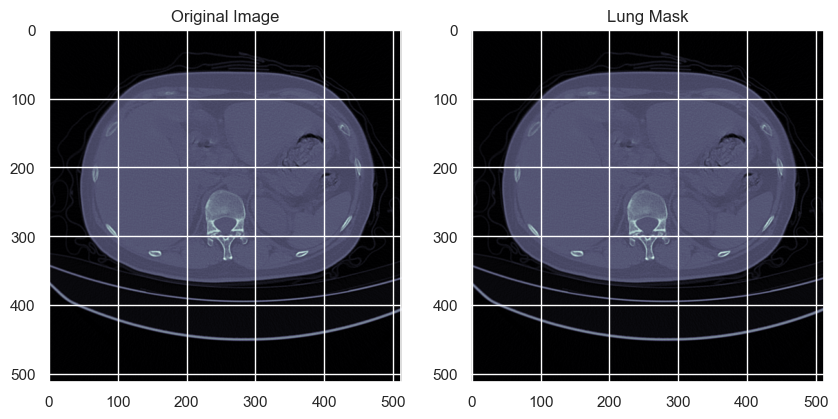

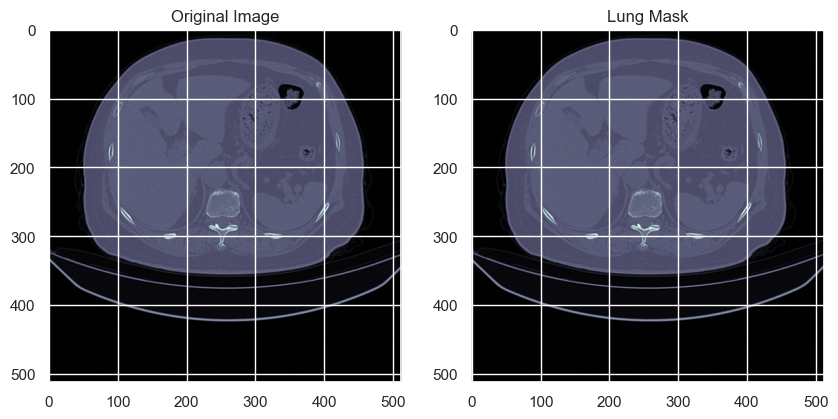

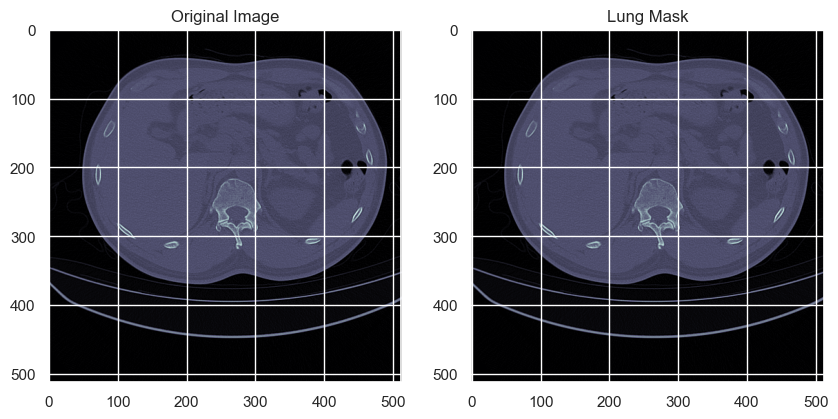

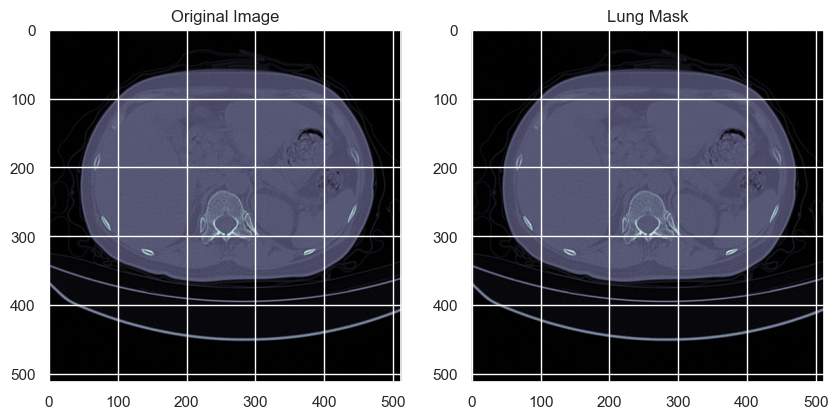

In [32]:
from random import sample
no_masks_sample=sample(no_masks,4)
for index in no_masks_sample:
    plot_sample([cts[index], lungs[index], infections[index]])

* Clearly these images don't have any lungs in them and should be omitted from the pipeline

In [33]:
gc.collect()

26109

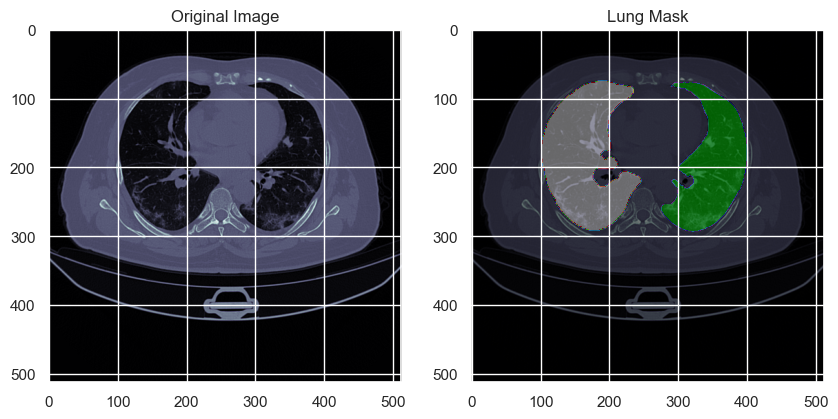

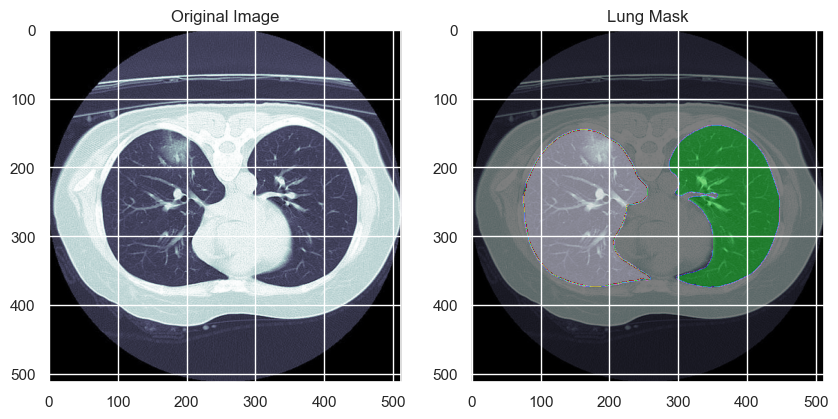

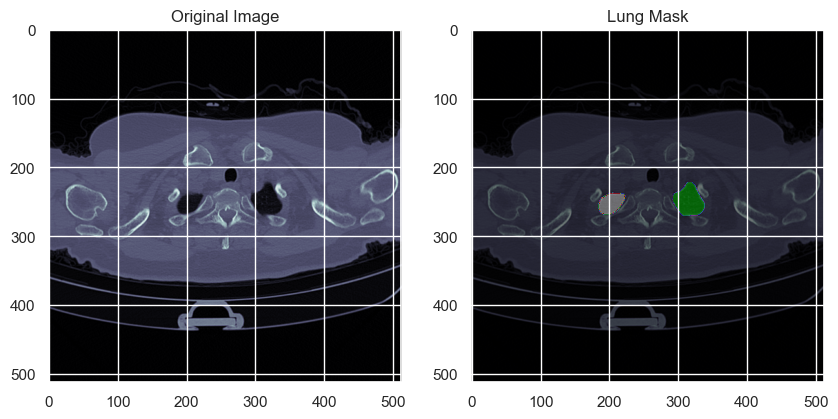

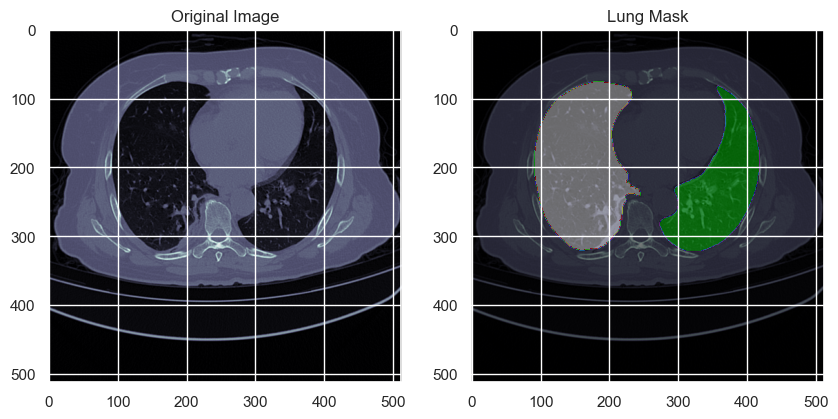

In [34]:
cts_sample=sample(range(len(cts)),4)
for index in cts_sample:
    plot_sample([cts[index], lungs[index]])

In [35]:
gc.collect()

23315

In [36]:
# removing the images w/o lung masks
for n in no_masks:
    del(cts[n])
    del(lungs[n])
    del(infections[n])

In [37]:
print(len(cts), len(lungs), len(infections))

2733 2733 2733


In [38]:
no_masks = []
for i in range(0, len(lungs)):
    if np.unique(lungs[i]).size == 1:
        no_masks.append(i)
print("Number of complete black masks :" , len(no_masks))

Number of complete black masks : 0


* Removing the empty masks seems to fix things.
* Furture feature: we can try to make this skip a slice if there is no mask.

In [84]:
new_cts = []
new_lungs = []

In [85]:
new_cts, new_lungs = clean_and_crop(cts,lungs)

In [86]:
gc.collect()

734

## Reshaping with a general funciton

In [135]:
# Making a def of the cleaning and cropping function I'm often using on the images
def clean_and_crop(array, mask, CLAHE=True):
    ''' CLAHE and Crop images.  Crop an array to a mask and cleanup with CLAHE. 
    by default will use CLAHE to clean image, use CLAHE=False to not use CLAHE 
    Make sure to export to two variables array and mask'''
    new_array=[]
    new_mask=[]
    for img_no in range(len(mask)):
        mask_img = mask[img_no]
        mask_img[mask_img>0]=1
        mask_img, points1, points2 = cropper(mask_img, demo = 0)
        new_mask.append(mask_img)
    if CLAHE ==True:

        for img_no in range(len(mask)):
            #CLAHE the image
            cts_img = array[img_no]
            cts_img = clahe_enhancer(cts_img, demo = 0)
            # Crop the image to the Mask
            a,b,c,d = points1[0], points1[1], points1[2], points1[3]
            e,f,g,h = points2[0], points2[1], points2[2], points2[3]
            img1 = cts_img[b:b+d, a:a+c]
            img1 = cv2.resize(img1, dsize=(125,250), interpolation=cv2.INTER_AREA)
            img2 = cts_img[f:f+h, e:e+g]
            img2 = cv2.resize(img2, dsize=(125,250), interpolation=cv2.INTER_AREA)
            cropped_cts = np.concatenate((img1, img2), axis=1)
            new_array.append(cropped_cts)
        return new_array, new_mask
    
    else:

        for img_no in range(len(mask)):
            #Load the Infection Mask
            infections_img = array[img_no]
            #Crop the Infection Mask to the Lung Mask
            a,b,c,d = points1[0], points1[1], points1[2], points1[3]
            e,f,g,h = points2[0], points2[1], points2[2], points2[3]
            img1 = infections_img[b:b+d, a:a+c]
            img1 = cv2.resize(img1, dsize=(125,250), interpolation=cv2.INTER_AREA)
            img2 = infections_img[f:f+h, e:e+g]
            img2 = cv2.resize(img2, dsize=(125,250), interpolation=cv2.INTER_AREA)
            cropped_infections = np.concatenate((img1, img2), axis=1)
            new_array.append(cropped_infections)
        return new_array, new_mask

In [152]:
newer_cts, newer_lungs = clean_and_crop(cts,lungs)
newer_infections, newest_lungs = clean_and_crop(infections, lungs, CLAHE=False)

In [154]:
newer_cts=new_dim(newer_cts)
print(np.shape(newer_cts), newer_cts.dtype)
newer_lungs=new_dim(newer_lungs)
print(np.shape(newer_lungs), newer_lungs.dtype)
newer_infections=new_dim(newer_infections)
print(np.shape(newer_infections), newer_infections.dtype)

(2106, 224, 224) uint8
(2106, 224, 224) uint8
(2106, 224, 224) uint8


In [150]:
np.shape(newer_cts)

(2106, 224, 224)

## Viewing our progress

(250, 250) (250, 250)


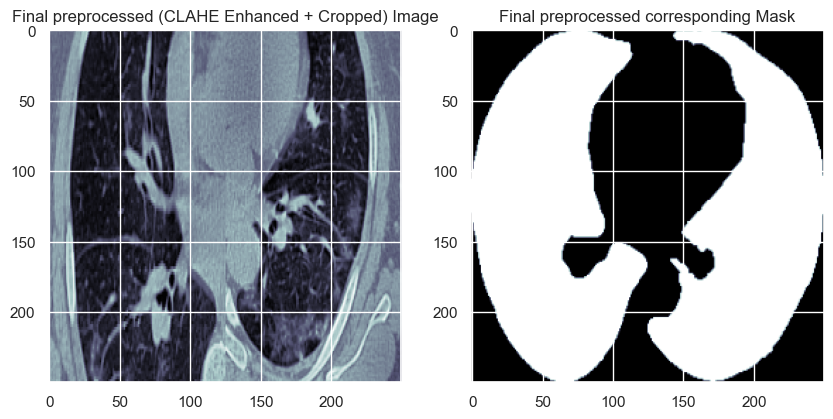

In [43]:
x = 100

rcParams['figure.figsize'] = 10,10

plt.subplot(1, 2, 1)
plt.imshow(new_cts[x], cmap='bone')
plt.title("Final preprocessed (CLAHE Enhanced + Cropped) Image")

plt.subplot(1, 2, 2)
plt.imshow(new_lungs[x], cmap='bone')
plt.title("Final preprocessed corresponding Mask")

print(new_cts[x].shape, new_lungs[x].shape)

* Something with my function is off.  These don't seem to match.

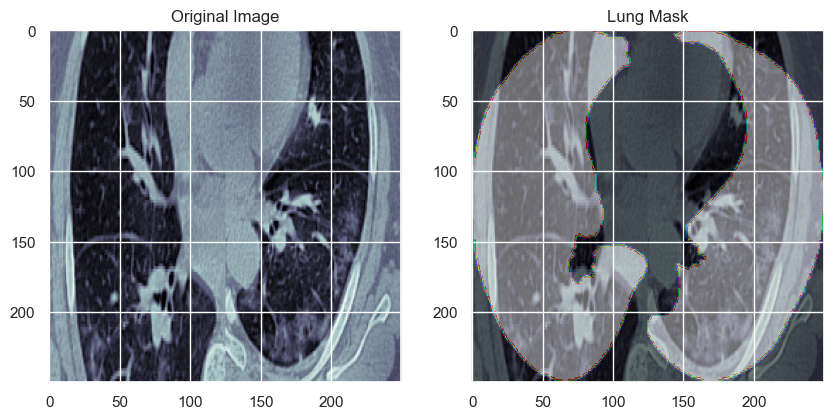

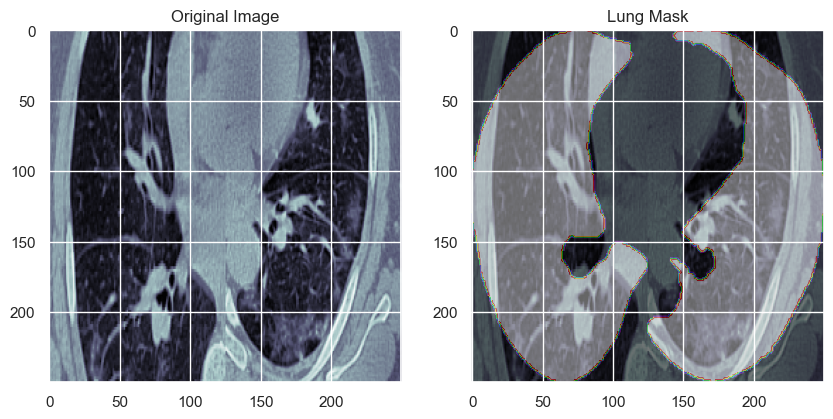

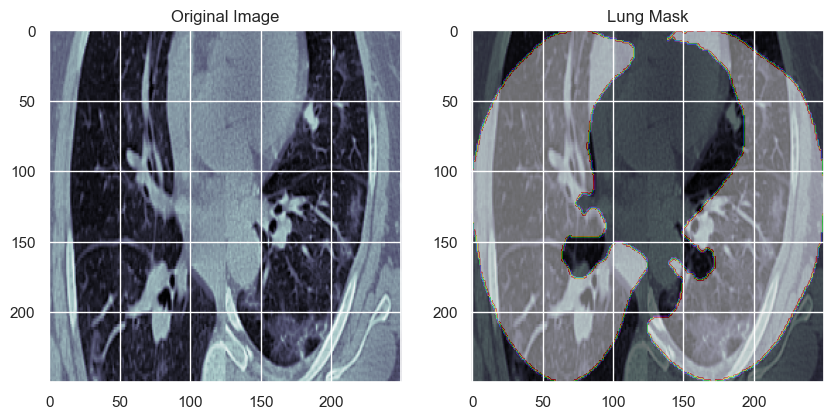

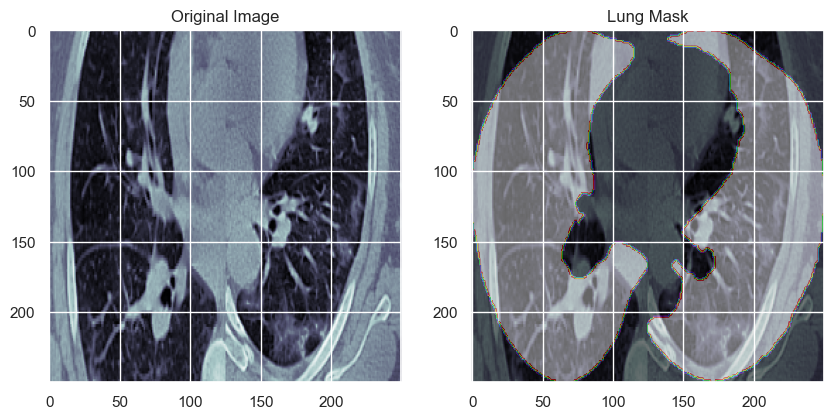

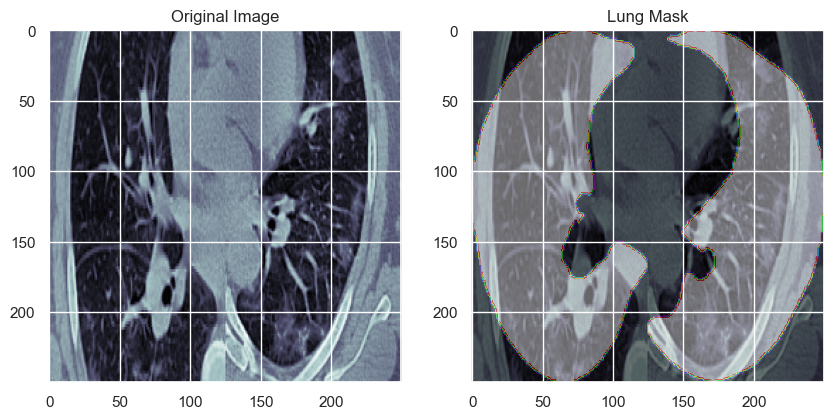

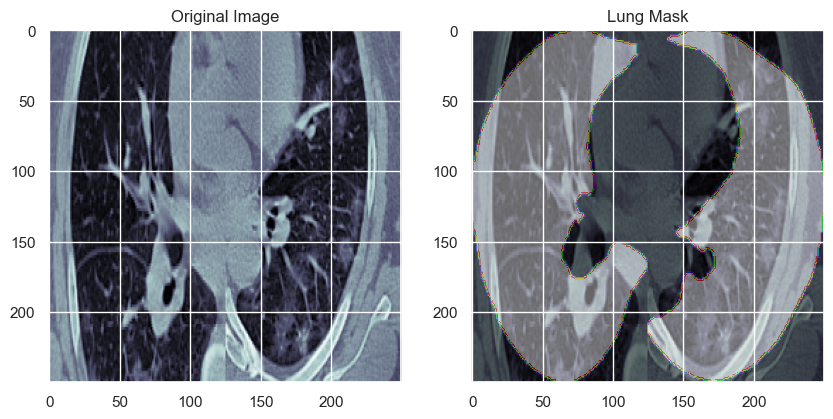

In [44]:
x = [99, 100, 101,102,103,104]
for index in x:
    plot_sample([new_cts[index], new_lungs[index]])

(512, 512) (512, 512)


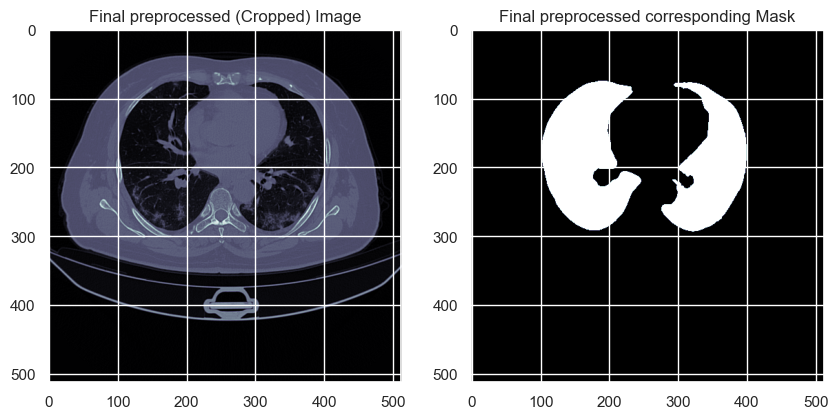

In [45]:
x = 100

rcParams['figure.figsize'] = 10,10

plt.subplot(1, 2, 1)
plt.imshow(cts[x], cmap='bone')
plt.title("Final preprocessed (Cropped) Image")

plt.subplot(1, 2, 2)
plt.imshow(lungs[x], cmap='bone')
plt.title("Final preprocessed corresponding Mask")

print(cts[x].shape, lungs[x].shape)

* Also, figuring out that _(492+6 for the blank lung)_ slices were of complete black masks i.e. no infection. For right now, kept out as didn't want to bother the segmentation model with this. 
* Possibly a better approach would be to make a sub-task and use that sub-task's output as input in our main task. Train a separate binary classifier to classify the CT scan as complete black or not, then the not ones to be passed from the segmentation model trained in this notebook.  The only issue with this is we now go from a binary system of Pneumonia or COVID to trinary (Healthy, COVID, Pneumonia)

In [46]:
gc.collect()

44315

(512, 512) (512, 512)


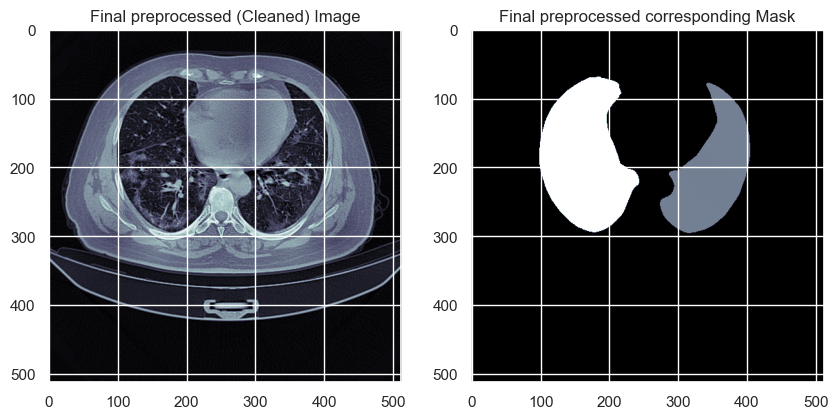

In [48]:
x = 100

rcParams['figure.figsize'] = 10,10

plt.subplot(1, 2, 1)
plt.imshow(clean_cts[x], cmap='bone')
plt.title("Final preprocessed (Cleaned) Image")

plt.subplot(1, 2, 2)
plt.imshow(clean_lungs[x], cmap='bone')
plt.title("Final preprocessed corresponding Mask")

print(clean_cts[x].shape, clean_lungs[x].shape)

(512, 512) (512, 512)


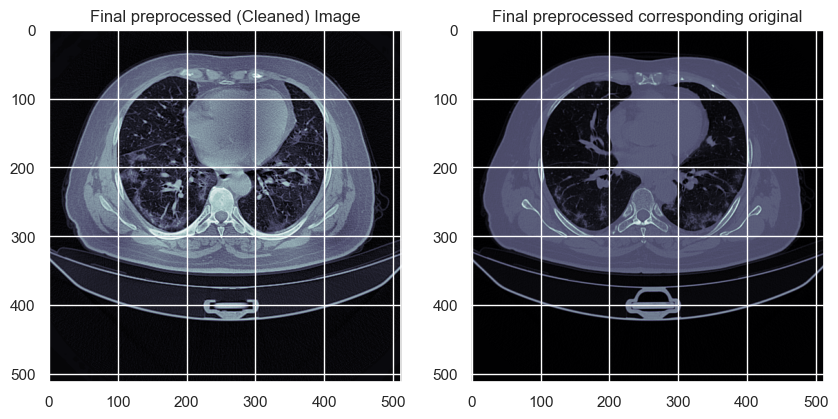

In [49]:
x = 100

rcParams['figure.figsize'] = 10,10

plt.subplot(1, 2, 1)
plt.imshow(clean_cts[x], cmap='bone')
plt.title("Final preprocessed (Cleaned) Image")

plt.subplot(1, 2, 2)
plt.imshow(cts[x], cmap='bone')
plt.title("Final preprocessed corresponding original")

print(clean_cts[x].shape, cts[x].shape)

## Training and Testing

* Finally 1614 samples which will later be split into train and test

* Also, since we copped the images and masks, all cannot be of same size, so again a dimension needs to be decided to which all could be resized to. 
* Used median of the all width and height but couldn't fit the RAM so reduced the size to 224, though images with larger resolution with more clear features will possibly give better results on the same model.

In [67]:
dim1=[]
dim2=[]
for i in range(0, len(cts)):
    dim1.append(cts[i].shape[0])
    dim2.append(cts[i].shape[1])
dim1 = np.array(dim1)
dim2 = np.array(dim2)

print("An idea about the new net dimension to which all must be resized to (some will increase and some decrease) --->\nMedian", np.median(dim1),'x', np.median(dim2))
print("Max", np.max(dim1),'x', np.max(dim2))
print("Min", np.min(dim1),'x', np.min(dim2))

An idea about the new net dimension to which all must be resized to (some will increase and some decrease) --->
Median 512.0 x 512.0
Max 512 x 512
Min 512 x 512


In [97]:
# Used median of the all width and height but couldn't fit the RAM so reduced the size to 224, 
# though images with larger resolution with more clear features will possibly give better results on the same model.
# Lets take a look at these and images and see what we have
def dim_224(array, new_dim=224):
    '''
    Rescales image array to new dimentions to have all images be the same dimensions.
    This can help with issues of images being too large to process due to lack of RAM
    '''

    for i in range(0,len(array)):
        array[i] = cv2.resize(array[i], dsize=(new_dim, new_dim), interpolation=cv2.INTER_LINEAR)
    array=np.array(array)
    array=np.uint8(array)
    return array

In [88]:
print('cts',type(new_cts),np.shape(new_cts))
print('lungs',type(new_lungs),np.shape(new_lungs))

cts <class 'list'> (2733, 250, 250)
lungs <class 'list'> (2733, 250, 250)


In [89]:
new_cts=dim_224(new_cts)
print(type(new_cts),np.shape(new_cts),new_cts.dtype)

<class 'numpy.ndarray'> (2733, 224, 224) uint8


In [90]:
new_lungs=dim_224(new_lungs)
print(type(new_lungs),np.shape(new_lungs), new_lungs.dtype)

<class 'numpy.ndarray'> (2733, 224, 224) uint8


In [93]:
print('cts',type(clean_cts),np.shape(clean_cts))
print('lungs',type(clean_lungs),np.shape(clean_lungs))

cts <class 'list'> (2816, 512, 512)
lungs <class 'list'> (2816, 512, 512)


In [102]:
new_clean_cts=dim_224(clean_cts)
print('new cleaned cts',type(new_clean_cts),np.shape(new_clean_cts), new_clean_cts.dtype)
new_clean_lungs=(dim_224(clean_lungs))
print('new cleained lungs',type(new_clean_lungs),np.shape(new_clean_lungs), new_clean_lungs.dtype)

new cleaned cts <class 'numpy.ndarray'> (2816, 224, 224) uint8
new cleained lungs <class 'numpy.ndarray'> (2816, 224, 224) uint8


* changed the dimensions to 224x224 to save memory

## Data augmentation pipeline

In [ ]:
sometimes = lambda aug: iaa.Sometimes(0.5, aug)

seq = iaa.Sequential([
    iaa.Fliplr(0.5), # horizontally flip 50% of all images
    iaa.Flipud(0.2), # vertically flip 20% of all images
    sometimes(iaa.Affine(
            scale={"x": (0.8, 1.2), "y": (0.8, 1.2)}, # scale images to 80-120% of their size, individually per axis
            translate_percent={"x": (-0.2, 0.2), "y": (-0.2, 0.2)}, # translate by -20 to +20 percent (per axis)
            rotate=(-40, 40), # rotate by -45 to +45 degrees
            shear=(-16, 16), # shear by -16 to +16 degrees
            # mode=ia.ALL # use any of scikit-image's warping modes (see 2nd image from the top for examples)
        ))
], random_order=True)

In [ ]:
no_of_aug_imgs = 50
random_indices = np.random.randint(0, new_cts.shape[0], size=no_of_aug_imgs)
sample_new_cts = new_cts[random_indices]
sample_new_lungs = new_lungs[random_indices]

In [ ]:
# sample_cts = np.floor(sample_cts)
# sample_inf = np.floor(sample_inf)
# sample_cts = np.uint64(sample_cts)
# sample_inf = np.uint64(sample_inf)

In [ ]:
new_cts_aug, new_lungs_aug = seq(images=sample_new_cts, 
                              segmentation_maps=sample_new_lungs)

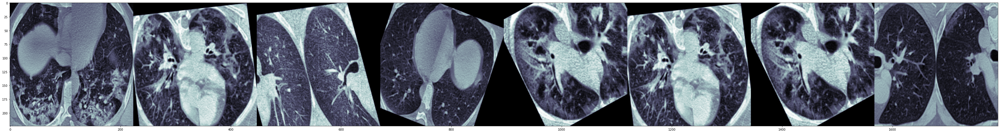

In [44]:
rcParams['figure.figsize'] = 60,60
rand = np.random.randint(0, no_of_aug_imgs, size=8)

cells1 = new_cts_aug[rand]
grid_image1 = np.hstack(cells1)
plt.imshow(grid_image1, cmap = 'bone')

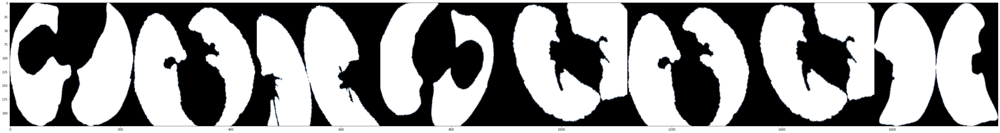

In [46]:
cells2 = new_lungs_aug[rand]
grid_image2 = np.hstack(cells2)
plt.imshow(grid_image2, cmap = 'bone')

In [47]:
print(new_cts_aug.shape, new_lungs_aug.shape)

(50, 224, 224) (50, 224, 224)


In [ ]:
# cts = np.concatenate((cts, cts_aug), axis=0)
# infections = np.concatenate((infections, infections_aug), axis = 0)
# np.random.shuffle(cts)
# np.random.shuffle(infections)
# print(cts.shape, infections.shape)

In [ ]:
new_cts_aug = new_cts_aug/255
new_lungs_aug = new_lungs_aug/255
new_cts_aug = new_cts_aug.reshape(len(new_cts_aug), new_dim, new_dim, 1)
new_lungs_aug = new_lungs_aug.reshape(len(new_lungs_aug), new_dim, new_dim, 1)

## Saving Files

In [49]:
joblib.dump(cts, 'cts_cropped_lungs_224.pkl')

['cts_cropped_lungs_224.pkl']

In [ ]:
files.download('cts_cropped_lungs_224.pkl')

In [91]:
gc.collect()

115

## Training Testing Splitting

In [92]:
# To process the data in our CNN we need the data to be (stack, 224, 224, 1)
new_dim=224
train_cts = new_cts.reshape(len(new_cts), new_dim, new_dim, 1)
train_lungs = new_lungs.reshape(len(new_lungs), new_dim, new_dim, 1)

In [103]:
# To process the data in our CNN we need the data to be (stack, 224, 224, 1)
new_dim=224
train_clean_cts = new_clean_cts.reshape(len(new_clean_cts), new_dim, new_dim, 1)
train_clean_lungs = new_clean_lungs.reshape(len(new_clean_lungs), new_dim, new_dim, 1)

In [104]:
x=train_cts # CLAHE enhanced cropped lung data for training
y=train_lungs # lung mask for testing

x_train, x_valid, y_train, y_valid = train_test_split(x, y, test_size=0.3, random_state=42) # random_state used for reproducibility
print('x shape:', x_train.shape, x_valid.shape)
print('y shape', y_train.shape, y_valid.shape)

x shape: (1913, 224, 224, 1) (820, 224, 224, 1)
y shape (1913, 224, 224, 1) (820, 224, 224, 1)


In [105]:
x2=train_clean_cts # CLAHE enhanced cropped lung data for training
y2=train_clean_lungs # infection mask for testing

x2_train, x2_valid, y2_train, y2_valid = train_test_split(x2, y2, test_size=0.3, random_state=42) # random_state used for reproducibility
print('x2 shape:', x2_train.shape, x2_valid.shape)
print('y2 shape', y2_train.shape, y_valid.shape)

x2 shape: (1971, 224, 224, 1) (845, 224, 224, 1)
y2 shape (1971, 224, 224, 1) (820, 224, 224, 1)


## Loss functions and metrics

In [106]:
# Some preformance metrics
def dice_coeff(y_true, y_pred):
    smooth = 1.
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    score = (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)
    return score

def dice_loss(y_true, y_pred):
    loss = 1 - dice_coeff(y_true, y_pred)
    return loss


def bce_dice_loss(y_true, y_pred):
    loss = 0.5*binary_crossentropy(y_true, y_pred) + 0.5*dice_loss(y_true, y_pred)
    return loss

def tversky_loss(y_true, y_pred):
    alpha = 0.5
    beta  = 0.5
    
    ones = K.ones(K.shape(y_true))
    p0 = y_pred      # proba that voxels are class i
    p1 = ones-y_pred # proba that voxels are not class i
    g0 = y_true
    g1 = ones-y_true
    
    num = K.sum(p0*g0, (0,1,2))
    den = num + alpha*K.sum(p0*g1,(0,1,2)) + beta*K.sum(p1*g0,(0,1,2))
    
    T = K.sum(num/den) # when summing over classes, T has dynamic range [0 Ncl]
    
    Ncl = K.cast(K.shape(y_true)[-1], 'float32')
    return Ncl-T

def weighted_bce_loss(y_true, y_pred, weight):
    epsilon = 1e-7
    y_pred = K.clip(y_pred, epsilon, 1. - epsilon)
    logit_y_pred = K.log(y_pred / (1. - y_pred))
    loss = weight * (logit_y_pred * (1. - y_true) + 
                     K.log(1. + K.exp(-K.abs(logit_y_pred))) + K.maximum(-logit_y_pred, 0.))
    return K.sum(loss) / K.sum(weight)

def weighted_dice_loss(y_true, y_pred, weight):
    smooth = 1.
    w, m1, m2 = weight, y_true, y_pred
    intersection = (m1 * m2)
    score = (2. * K.sum(w * intersection) + smooth) / (K.sum(w * m1) + K.sum(w * m2) + smooth)
    loss = 1. - K.sum(score)
    return loss

def weighted_bce_dice_loss(y_true, y_pred):
    y_true = K.cast(y_true, 'float32')
    y_pred = K.cast(y_pred, 'float32')
    # if we want to get same size of output, kernel size must be odd
    averaged_mask = K.pool2d(
            y_true, pool_size=(50, 50), strides=(1, 1), padding='same', pool_mode='avg')
    weight = K.ones_like(averaged_mask)
    w0 = K.sum(weight)
    weight = 5. * K.exp(-5. * K.abs(averaged_mask - 0.5))
    w1 = K.sum(weight)
    weight *= (w0 / w1)
    loss = 0.5*weighted_bce_loss(y_true, y_pred, weight) + 0.5*dice_loss(y_true, y_pred)
    return loss

* All the hyperparameters are put in place after repeating trial and error for a fixed number of epochs.

In [107]:
from tensorflow import keras
from keras.callbacks import Callback
from keras.losses import binary_crossentropy, sparse_categorical_crossentropy
from keras.models import Model, load_model
from keras.layers import Input, BatchNormalization, Activation, Dense, Dropout
from keras.layers.core import Lambda, RepeatVector, Reshape
from keras.layers.convolutional import Conv2D, Conv2DTranspose, Conv3D, Conv3DTranspose
from keras.layers.pooling import MaxPooling2D, GlobalMaxPool2D, MaxPooling3D, GlobalMaxPool3D
from keras.layers.merge import concatenate, add
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, LearningRateScheduler
from keras.optimizers import Adam
from keras.preprocessing.image import ImageDataGenerator #,img_to_array, array_to_img , load_img are supposed to be in this mix but I got errors
from keras import backend as K

In [108]:
# Model 4 Similar to model 1 but the layers are not connected liniarly. 
# This is faster.
inputs = Input((new_dim, new_dim, 1)) #Makes a tensor for convolving
    
x = Conv2D(32, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (inputs)
x = Conv2D(32, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (x)
x = BatchNormalization()(x)  # Normalizes the data
x = MaxPooling2D((2, 2))(x)  # pulls the data by averageing a 2x2 block 
x = Dropout(0.25)(x)   # Drops out 25% of the connections randomly during training to prevent overfitting

x = Conv2D(64, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (x)
x = Conv2D(64, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (x)
x = BatchNormalization()(x)
x = MaxPooling2D((2, 2)) (x)
x = Dropout(0.25)(x)

x = Conv2D(128, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (x)
x = Conv2D(128, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (x)
x = BatchNormalization()(x)
x = MaxPooling2D((2, 2)) (x)
x = Dropout(0.25)(x)

x = Conv2D(256, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (x)
x = Conv2D(256, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (x)
x = BatchNormalization()(x)
x = MaxPooling2D(pool_size=(2, 2)) (x)
x = Dropout(0.25)(x)

x = Conv2D(512, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (x)
x = Conv2D(512, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (x)

x = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same') (x)
x = Conv2D(256, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (x)

x = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same') (x)
x = Conv2D(128, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (x)

x = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same') (x)
x = Conv2D(64, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (x)

x = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same') (x)
x = Conv2D(32, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (x)

outputs = Conv2D(1, (1, 1), activation='sigmoid') (x)

model = Model(inputs=[inputs], outputs=[outputs], name='relu_model')
model.summary()

Model: "relu_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 1)]     0         
                                                                 
 conv2d (Conv2D)             (None, 224, 224, 32)      320       
                                                                 
 conv2d_1 (Conv2D)           (None, 224, 224, 32)      9248      
                                                                 
 batch_normalization (BatchN  (None, 224, 224, 32)     128       
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 112, 112, 32)     0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 112, 112, 32)      0

### Deadskull7's Call Back methods

* Some callbacks (model checkpointing with least validation loss, highest validation dice coefficient, learning rate reduction after some patience number of epochs)
* Also experimented with exponential decaying learning rate but found ReduceLROnPlateau a bit effective in this case.

In [109]:
class CosineAnnealingScheduler(Callback):
    """Cosine annealing scheduler.
    This will start with a high learning rate and rapidly lower it before ramping it back up again.
    By doing this we can retest good weights that were lost when the learning rate was changed.
    """

    def __init__(self, T_max, eta_max, eta_min=0, verbose=1):
        super(CosineAnnealingScheduler, self).__init__()
        self.T_max = T_max
        self.eta_max = eta_max
        self.eta_min = eta_min
        self.verbose = verbose

    def on_epoch_begin(self, epoch, logs=None):
        if not hasattr(self.model.optimizer, 'lr'):
            raise ValueError('Optimizer must have a "lr" attribute.')
        lr = self.eta_min + (self.eta_max - self.eta_min) * (1 + math.cos(math.pi * epoch / self.T_max)) / 2
        K.set_value(self.model.optimizer.lr, lr)
        print('\nEpoch %05d: CosineAnnealingScheduler setting learning ''rate to %s.' % (epoch + 1, lr))

    def on_epoch_end(self, epoch, logs=None):
        logs = logs or {}
        logs['lr'] = K.get_value(self.model.optimizer.lr)

In [110]:
cosine_annealer = CosineAnnealingScheduler(T_max=7, eta_max=0.0005, eta_min=0.0001)

In [111]:
batch_size = 16 #reduced from original 32 because of memory issues
epochs = 60 #Reduced from 60 because in previous runs improvement stopped around there.
#lr_reduce = ReduceLROnPlateau(monitor='val_loss', factor=0.7, patience=7, verbose=1)
filepath_dice_coeff="unet_covid_weights_dice_coeff_lung.hdf5"
filepath_loss = "unet_covid_weights_val_loss_lung.hdf5"
checkpoint_dice = ModelCheckpoint(filepath_dice_coeff, monitor='val_dice_coeff', verbose=1, save_best_only=True, mode='max')
checkpoint_loss = ModelCheckpoint(filepath_loss, monitor='val_loss', verbose=1, save_best_only=True, mode='min')

In [112]:
gc.collect()

1156

In [113]:
model.compile(optimizer=Adam(learning_rate = 0.0005), loss=bce_dice_loss, metrics=[dice_coeff])
results = model.fit(x_train, y_train, batch_size=batch_size, epochs=epochs,
                    validation_data=(x_valid, y_valid),
                    callbacks = [checkpoint_dice, checkpoint_loss],
                    use_multiprocessing=True)

Epoch 1/60


TypeError: in user code:

    File "C:\ProgramData\Anaconda3\envs\Covid_19_X_Rays\lib\site-packages\keras\engine\training.py", line 1160, in train_function  *
        return step_function(self, iterator)
    File "C:\Users\User\AppData\Local\Temp\ipykernel_6968\669441436.py", line 16, in bce_dice_loss  *
        loss = 0.5*binary_crossentropy(y_true, y_pred) + 0.5*dice_loss(y_true, y_pred)
    File "C:\Users\User\AppData\Local\Temp\ipykernel_6968\669441436.py", line 11, in dice_loss  *
        loss = 1 - dice_coeff(y_true, y_pred)
    File "C:\Users\User\AppData\Local\Temp\ipykernel_6968\669441436.py", line 6, in dice_coeff  *
        intersection = K.sum(y_true_f * y_pred_f)

    TypeError: Input 'y' of 'Mul' Op has type float32 that does not match type uint8 of argument 'x'.


In [114]:
results = model.fit(x2_train, y2_train, batch_size=batch_size, epochs=epochs,
                    validation_data=(x2_valid, y2_valid),
                    callbacks = [checkpoint_dice, checkpoint_loss],
                    use_multiprocessing=True)

Epoch 1/60


TypeError: in user code:

    File "C:\ProgramData\Anaconda3\envs\Covid_19_X_Rays\lib\site-packages\keras\engine\training.py", line 1160, in train_function  *
        return step_function(self, iterator)
    File "C:\Users\User\AppData\Local\Temp\ipykernel_6968\669441436.py", line 16, in bce_dice_loss  *
        loss = 0.5*binary_crossentropy(y_true, y_pred) + 0.5*dice_loss(y_true, y_pred)
    File "C:\Users\User\AppData\Local\Temp\ipykernel_6968\669441436.py", line 11, in dice_loss  *
        loss = 1 - dice_coeff(y_true, y_pred)
    File "C:\Users\User\AppData\Local\Temp\ipykernel_6968\669441436.py", line 6, in dice_coeff  *
        intersection = K.sum(y_true_f * y_pred_f)

    TypeError: Input 'y' of 'Mul' Op has type float32 that does not match type uint8 of argument 'x'.


In [1]:
gc.collect()

NameError: name 'gc' is not defined

### Standard compile

In [ ]:
model.compile(optimizer=Adam(learning_rate = 0.0005), loss='categorical_crossentropy', metrics=['accuracy'])
results = model.fit(x_train, y_train, batch_size=batch_size, epochs=epochs,
                    validation_data=(x_valid, y_valid),
                    use_multiprocessing=True)

Epoch 1/60


In [ ]:
model.compile(optimizer=Adam(learning_rate = 0.0005), loss='categorical_crossentropy', metrics=['accuracy'])
results2 = model.fit(x2_train, y2_train, batch_size=batch_size, epochs=epochs,
                    validation_data=(x2_valid, y2_valid),
                    use_multiprocessing=True)

## Validation

In [62]:
score = model.evaluate(x_valid, y_valid, batch_size=32)
print("test loss, test dice coefficient:", score)

632/632 [==============================] - 3s 4ms/step
test loss, test dice coefficient: [0.03528652127973641, 0.9812613725662231]


* I have specifically saved the least loss model rather than highest dice coefficient because, loss is generally a better predictor for overfitting, as you can see the validation dice coefficient still increased in the 79 th epoch when there was overfitting but loss was last saved on 51 st epoch, thus refrained more from overfitting.

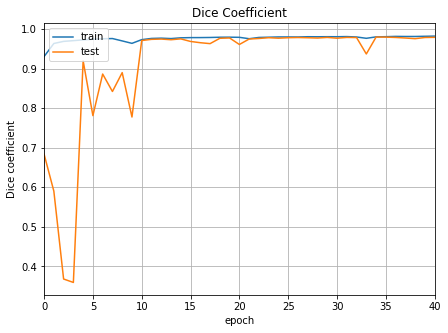

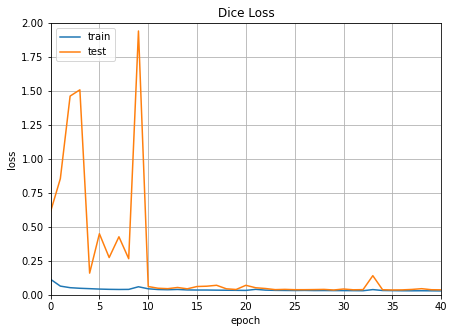

In [ ]:
plt.rcParams["axes.grid"] = True
rcParams['figure.figsize'] = 7, 5
plt.xlim(0, 40)
plt.plot(results.history['dice_coeff'])
plt.plot(results.history['val_dice_coeff'])
plt.title('Dice Coefficient')
plt.ylabel('Dice coefficient')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.ylim(0, 2)
plt.xlim(0, 40)
plt.plot(results.history['loss'])
plt.plot(results.history['val_loss'])
plt.title('Dice Loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

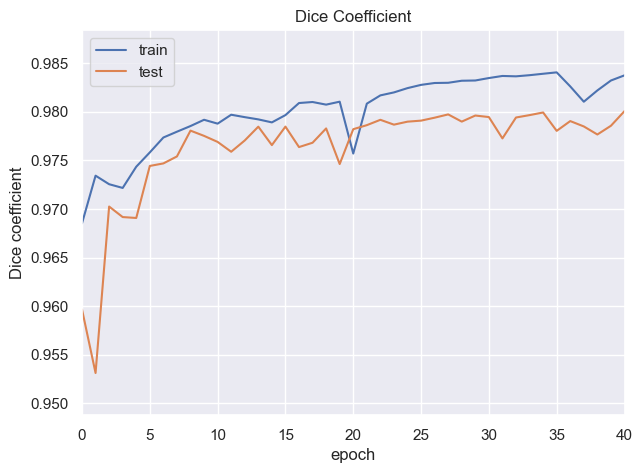

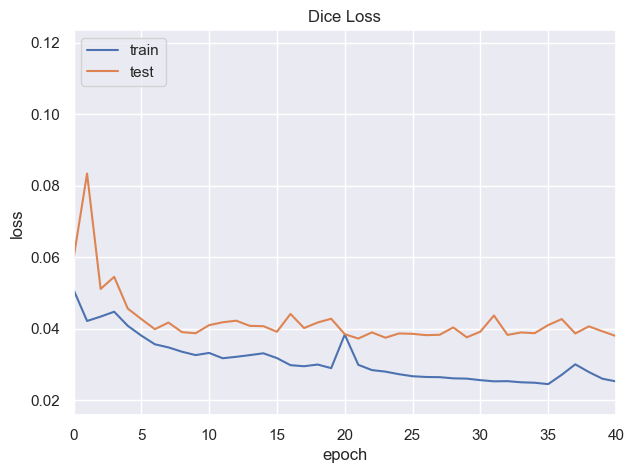

In [97]:
plt.rcParams["axes.grid"] = True
rcParams['figure.figsize'] = 7, 5
plt.xlim(0, 40)
plt.plot(results_4.history['dice_coeff'])
plt.plot(results_4.history['val_dice_coeff'])
plt.title('Dice Coefficient')
plt.ylabel('Dice coefficient')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
#plt.ylim(0, 2)
plt.xlim(0, 40)
plt.plot(results_4.history['loss'])
plt.plot(results_4.history['val_loss'])
plt.title('Dice Loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

* Some actual vs predicted samples to check the performance of the model visually. Notice, how overlapping they are with each other, thus justifying the high dice coefficient.

In [ ]:
plt.rcParams["axes.grid"] = False

In [98]:
def compare_actual_and_predicted(image_no, model):
    temp = model.predict(new_cts[image_no].reshape(1,new_dim, new_dim, 1))

    fig = plt.figure(figsize=(15,15))

    plt.subplot(1,3,1)
    plt.imshow(new_cts[image_no].reshape(new_dim, new_dim), cmap='bone')
    plt.title('Original Image (CT)')

    plt.subplot(1,3,2)
    plt.imshow(new_lungs[image_no].reshape(new_dim,new_dim), cmap='bone')
    plt.title('Actual mask')

    plt.subplot(1,3,3)
    plt.imshow(temp.reshape(new_dim,new_dim), cmap='bone')
    plt.title('Predicted mask')

    plt.show()
    
# plt.imshow(temp.reshape(img_size, img_size), cmap = 'bone')
# plt.imshow(infections_scaled[120].reshape(img_size, img_size), cmap ='summer')

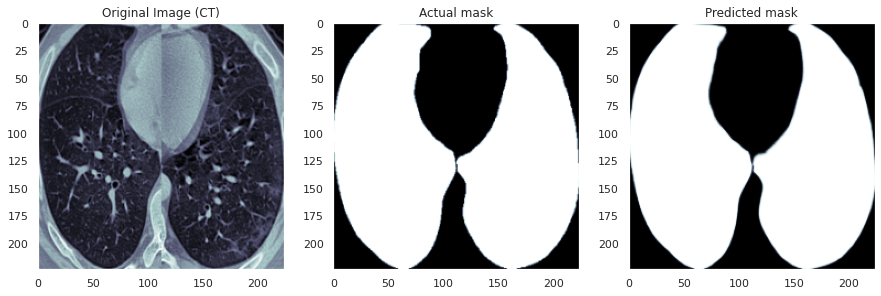

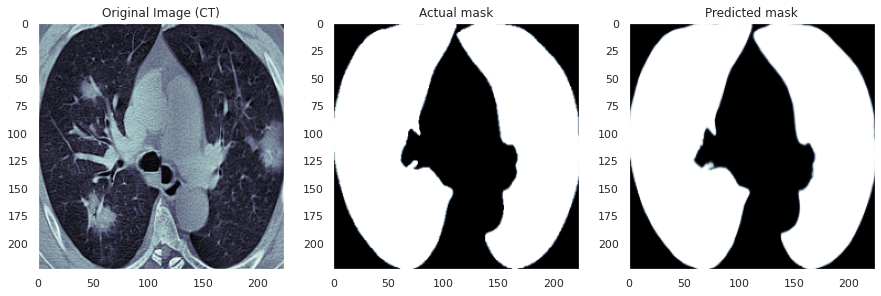

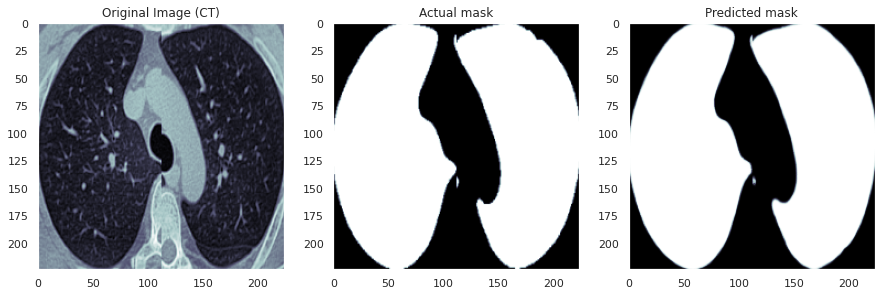

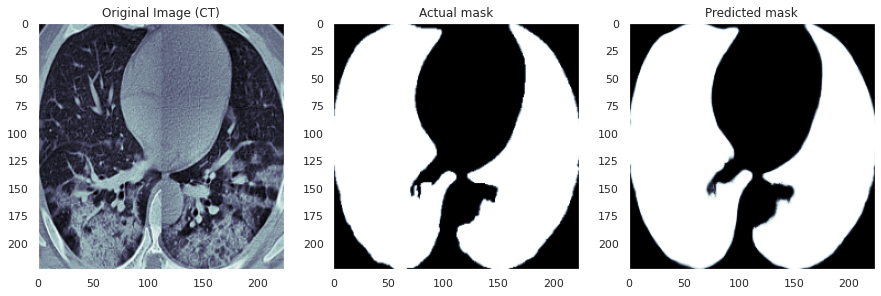

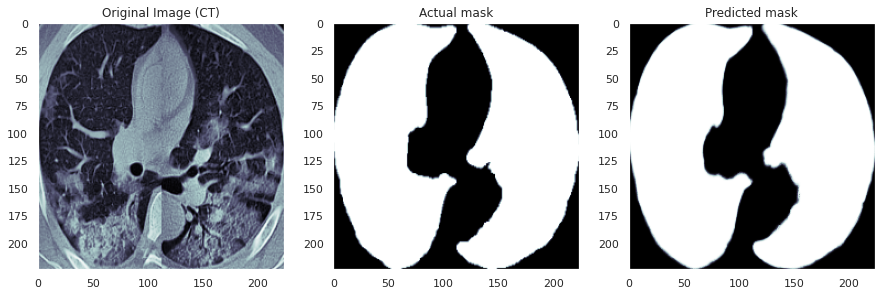

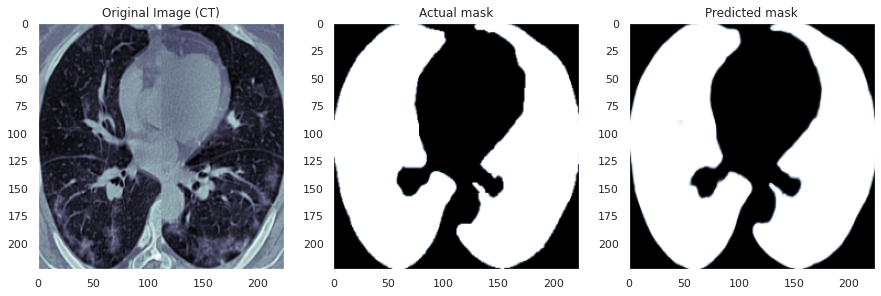

In [ ]:
for i in [440,269,555, 355, 380, 90]:
    compare_actual_and_predicted(i, model)

1/1 [==============================] - 3s 3s/step


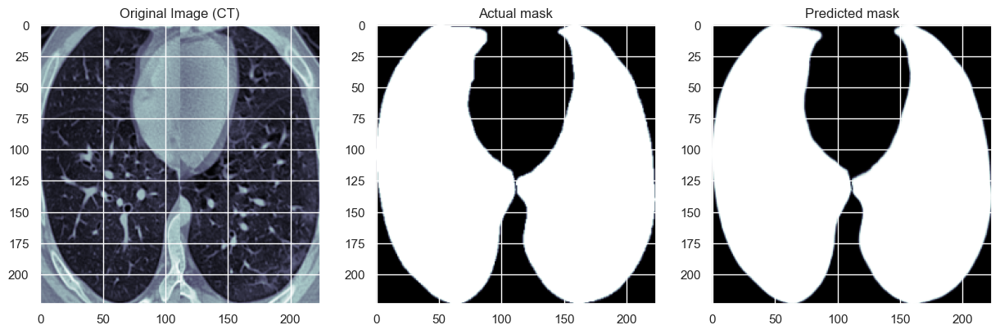

1/1 [==============================] - 2s 2s/step


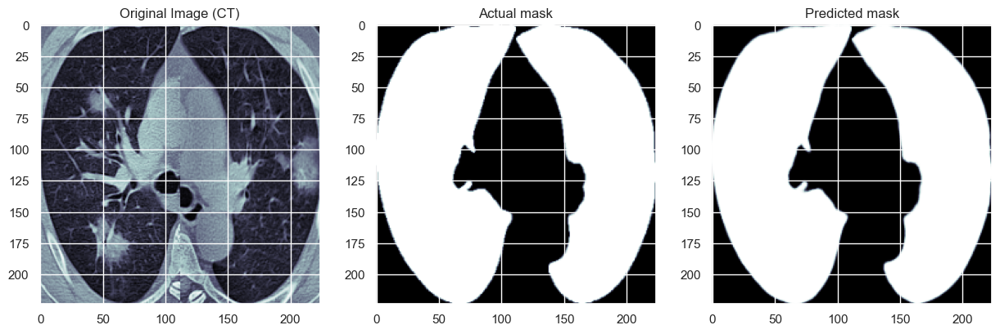

1/1 [==============================] - 1s 781ms/step


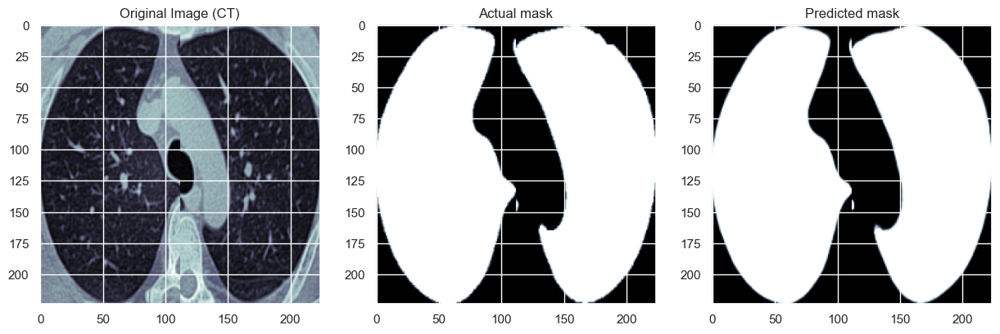

1/1 [==============================] - 1s 784ms/step


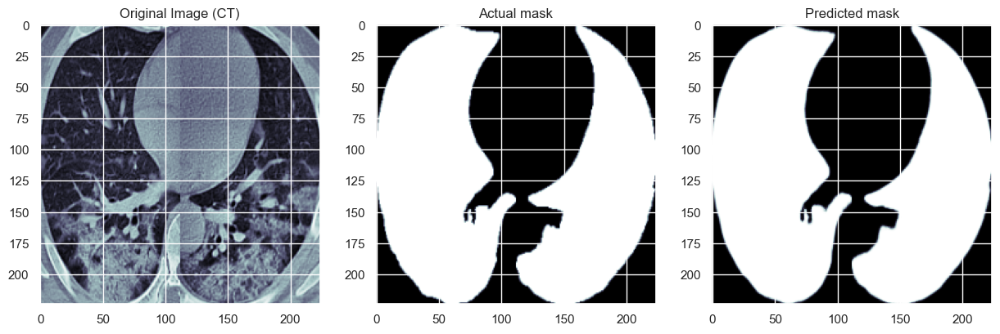

1/1 [==============================] - 1s 778ms/step


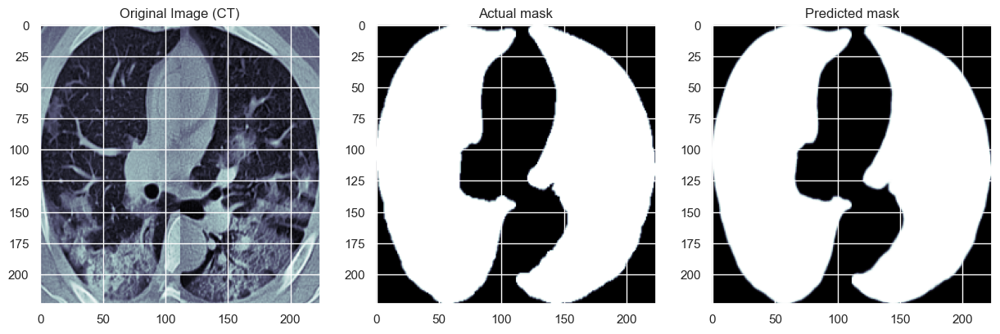

1/1 [==============================] - 1s 786ms/step


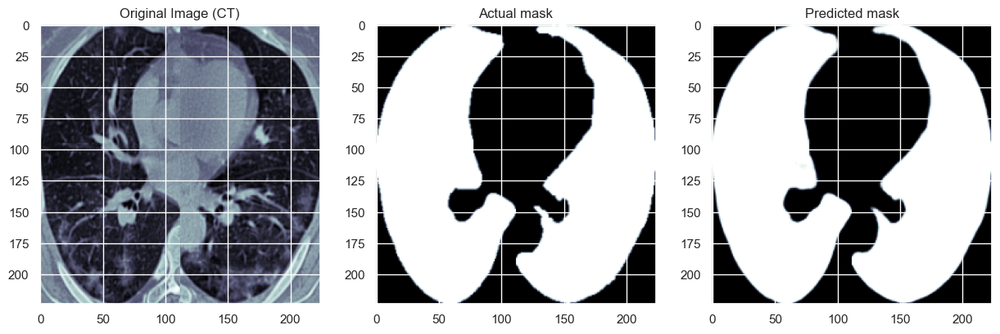

In [99]:
for i in [440,269,555, 355, 380, 90]:
    compare_actual_and_predicted(i, model_4)

In [100]:
gc.collect()

67982

# Some Significant Post-Processing

In [54]:
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# model.load_weights(filepath_dice_coeff)
model.load_weights('/content/drive/My Drive/cts and infections/unet_lung_segmentation_0.9813.h5')

In [ ]:
the_range = np.arange(0.10,0.80, 0.05)

In [64]:
dices=[]
ious=[]

for t in the_range:
    iou = sm.metrics.IOUScore(threshold=t)
    dice = sm.metrics.FScore(threshold=t)
    model.compile(optimizer=Adam(lr = 0.0005), loss=bce_dice_loss, metrics=[dice, iou])
    score = model.evaluate(x_valid, y_valid, batch_size=32)
    dices.append(score[1])
    ious.append(score[2])

Segmentation Models: using `keras` framework.
632/632 [==============================] - 3s 5ms/step


In [65]:
print('DICES:',dices)
print("IOUS:",ious)
print("Best Threshold:", the_range[np.argmax(dices)])
print("Best dice score:", dices[np.argmax(dices)])
print("Best iou score:", ious[np.argmax(ious)])

DICES: [0.979864239692688, 0.9816188812255859, 0.9826875925064087, 0.9833887219429016, 0.983862578868866, 0.9841766357421875, 0.9843804240226746, 0.9844814538955688, 0.9845043420791626, 0.9844471216201782, 0.984300434589386, 0.9840526580810547, 0.9836636781692505, 0.983102023601532]
IOUS: [0.9605323672294617, 0.9639099836349487, 0.9659732580184937, 0.967329204082489, 0.9682466387748718, 0.9688552021980286, 0.9692505598068237, 0.9694461822509766, 0.9694908857345581, 0.9693800210952759, 0.9690955281257629, 0.9686158299446106, 0.9678621292114258, 0.9667754173278809]
Best Threshold: 0.5000000000000001
Best dice score: 0.9845043420791626
Best iou score: 0.9694908857345581


Best Threshold: 0.5000000000000001


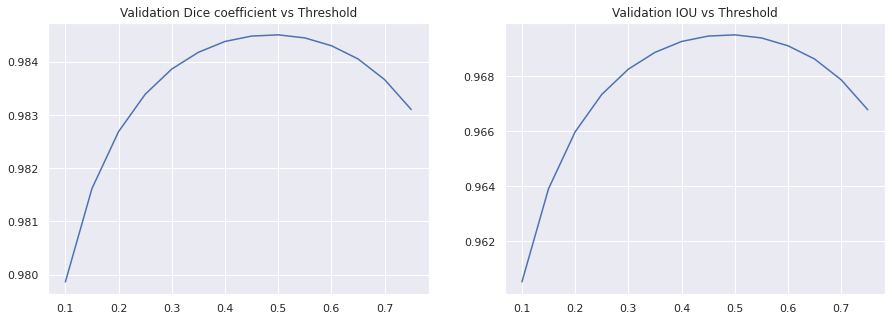

In [68]:
print("Best Threshold:", the_range[np.argmax(dices)])
fig = plt.figure(figsize=(15,5))

plt.subplot(1, 2, 1)
plt.plot(the_range, dices)
plt.title("Validation Dice coefficient vs Threshold")

plt.subplot(1, 2, 2)
plt.plot(the_range, ious)
plt.title("Validation IOU vs Threshold")

plt.show()

In [ ]:
the_new_range = np.arange(0.43,0.53, 0.001)

In [71]:
new_dices=[]
new_ious=[]

for t in the_new_range:
  iou = sm.metrics.IOUScore(threshold=t)
  dice = sm.metrics.FScore(threshold=t)
  model.compile(optimizer=Adam(lr = 0.0005), loss=bce_dice_loss, metrics=[dice, iou])
  score = model.evaluate(x_valid, y_valid, batch_size=32)
  new_dices.append(score[1])
  new_ious.append(score[2])

632/632 [==============================] - 3s 5ms/step


In [ ]:
# print("We just checked for",len(the_new_range), "steps between 0.39 and 0.47")

In [73]:
print('NEW DICES:',new_dices)
print("NEW IOUS:",new_ious)
print("New Best Threshold:", the_new_range[np.argmax(new_dices)])
print("Best new dice score:", new_dices[np.argmax(new_dices)])
print("Best new iou score:", new_ious[np.argmax(new_ious)])

NEW DICES: [0.9844532012939453, 0.9844545125961304, 0.9844573140144348, 0.9844592809677124, 0.9844595193862915, 0.9844616055488586, 0.9844633340835571, 0.9844646453857422, 0.9844660758972168, 0.984467625617981, 0.9844684600830078, 0.984470009803772, 0.9844714403152466, 0.9844719171524048, 0.9844738841056824, 0.9844741821289062, 0.9844750165939331, 0.984477162361145, 0.9844790697097778, 0.9844805598258972, 0.9844814538955688, 0.9844824075698853, 0.9844825863838196, 0.9844840168952942, 0.9844844937324524, 0.9844857454299927, 0.9844872355461121, 0.9844886660575867, 0.984490692615509, 0.9844916462898254, 0.9844924807548523, 0.9844934344291687, 0.9844943881034851, 0.9844951629638672, 0.9844964742660522, 0.9844979047775269, 0.9844985008239746, 0.9844988584518433, 0.9844985008239746, 0.9844998121261597, 0.9845002293586731, 0.9845004081726074, 0.9845014810562134, 0.9845021367073059, 0.9845024347305298, 0.9845035672187805, 0.9845045208930969, 0.9845043420791626, 0.9845050573348999, 0.9845060110

Best Threshold: 0.49200000000000005


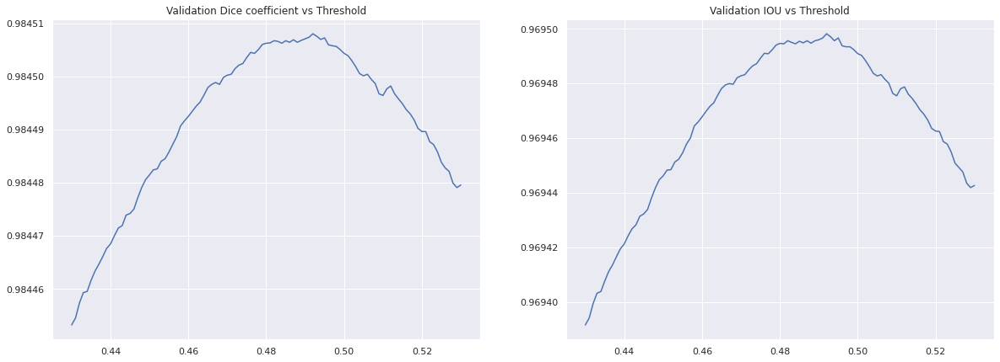

In [74]:
print("Best Threshold:", the_new_range[np.argmax(new_dices)])
fig = plt.figure(figsize=(20,7))

plt.subplot(1, 2, 1)
plt.plot(the_new_range, new_dices)
plt.title("Validation Dice coefficient vs Threshold")

plt.subplot(1, 2, 2)
plt.plot(the_new_range, new_ious)
plt.title("Validation IOU vs Threshold")

plt.show()

In [ ]:
the_prec_rec_range = np.arange(0,1, 0.05)

In [76]:
precisions=[]
recalls=[]

for t in the_prec_rec_range:
  precision = sm.metrics.Precision(threshold=t)
  recall = sm.metrics.Recall(threshold=t)
  model.compile(optimizer=Adam(lr = 0.0005), loss=bce_dice_loss, metrics=[precision, recall])
  score = model.evaluate(x_valid, y_valid, batch_size=32)
  precisions.append(score[1])
  recalls.append(score[2])

632/632 [==============================] - 3s 5ms/step


In [77]:
print('PRECISIONS:',precisions)
print("RRECALLS:",recalls)
print("Best Threshold for Precision:", the_prec_rec_range[np.argmax(precisions)])
print("Best Threshold for Recall:", the_prec_rec_range[np.argmax(recalls)])
print("Best precision score:", precisions[np.argmax(precisions)])
print("Best recall score:", recalls[np.argmax(recalls)])

PRECISIONS: [0.5851823091506958, 0.957274317741394, 0.9655100703239441, 0.9702876806259155, 0.9736343622207642, 0.9762035608291626, 0.9783096313476562, 0.9800945520401001, 0.9816813468933105, 0.9831101298332214, 0.9844439625740051, 0.9856937527656555, 0.9869080781936646, 0.9881035685539246, 0.9893237948417664, 0.9905902743339539, 0.9919060468673706, 0.9933151006698608, 0.9948309659957886, 0.9965618252754211]
RRECALLS: [1.0, 0.996345043182373, 0.9946549534797668, 0.9932201504707336, 0.9919129610061646, 0.9906824827194214, 0.9894807934761047, 0.9882946014404297, 0.9870961904525757, 0.9858579635620117, 0.984566330909729, 0.9832048416137695, 0.9817076921463013, 0.9800363779067993, 0.9780693054199219, 0.9757275581359863, 0.9727616310119629, 0.9688626527786255, 0.9632226824760437, 0.9534371495246887]
Best Threshold for Precision: 0.9500000000000001
Best Threshold for Recall: 0.0
Best precision score: 0.9965618252754211
Best recall score: 1.0


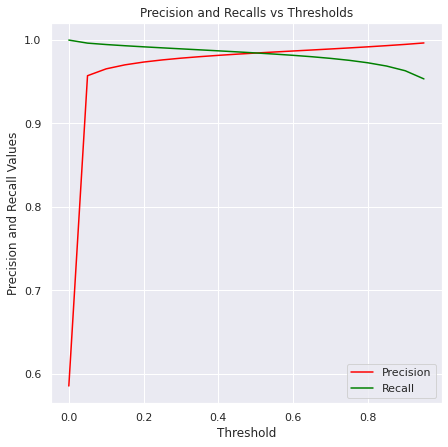

In [78]:
rcParams['figure.figsize'] = 7,7
plt.rcParams["axes.grid"] = True
plt.title("Precision and Recalls vs Thresholds")
plt.xlabel('Threshold')
plt.ylabel('Precision and Recall Values')
plt.plot(the_prec_rec_range,precisions, color='red')
plt.plot(the_prec_rec_range, recalls, color='green')
plt.legend(['Precision', 'Recall'])

In [107]:
dices=[]
ious=[]
the_range = np.arange(0.05,0.80, 0.075)

for t in the_range:
    iou = sm.metrics.IOUScore(threshold=t)
    dice = sm.metrics.FScore(threshold=t)
    model_4.compile(optimizer=Adam(learning_rate = 0.0005), loss=bce_dice_loss, metrics=[dice, iou])
    score = model_4.evaluate(x_valid, y_valid, batch_size=16)
    dices.append(score[1])
    ious.append(score[2])

40/40 [==============================] - 5s 51ms/step - loss: 0.0416 - f1-score: 0.9816 - iou_score: 0.9639


In [108]:
gc.collect()

8846

In [109]:
print('DICES:',dices)
print("IOUS:",ious)
print("Best Threshold:", the_range[np.argmax(dices)])
print("Best dice score:", dices[np.argmax(dices)])
print("Best iou score:", ious[np.argmax(ious)])

DICES: [0.9787365198135376, 0.981681227684021, 0.9828025698661804, 0.9833120107650757, 0.9834960699081421, 0.9834800958633423, 0.9833041429519653, 0.982968807220459, 0.9824366569519043, 0.9816262125968933]
IOUS: [0.9583784937858582, 0.9640421867370605, 0.9662073254585266, 0.9671931266784668, 0.9675495028495789, 0.9675191044807434, 0.9671789407730103, 0.9665305018424988, 0.965502917766571, 0.9639390110969543]
Best Threshold: 0.35
Best dice score: 0.9834960699081421
Best iou score: 0.9675495028495789


Best Threshold: 0.35


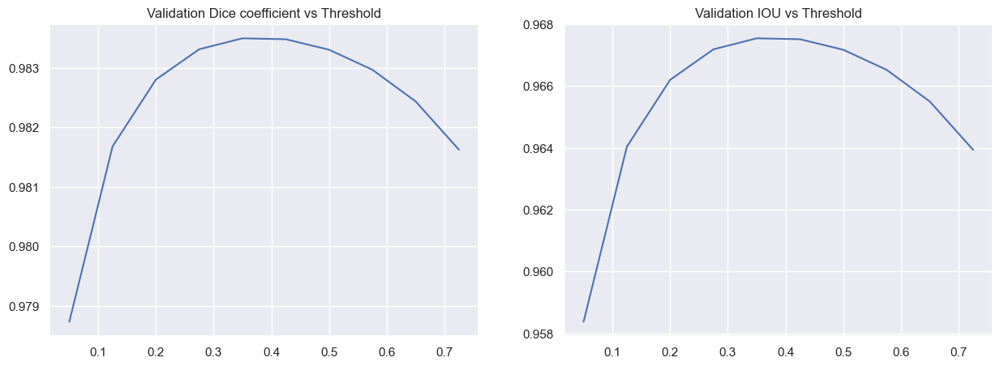

In [110]:
print("Best Threshold:", the_range[np.argmax(dices)])
fig = plt.figure(figsize=(15,5))

plt.subplot(1, 2, 1)
plt.plot(the_range, dices)
plt.title("Validation Dice coefficient vs Threshold")

plt.subplot(1, 2, 2)
plt.plot(the_range, ious)
plt.title("Validation IOU vs Threshold")

plt.show()

In [111]:
gc.collect()

23

In [112]:
the_prec_rec_range = np.arange(0,1, 0.1)
precisions=[]
recalls=[]

for t in the_prec_rec_range:
    precision = sm.metrics.Precision(threshold=t)
    recall = sm.metrics.Recall(threshold=t)
    model_4.compile(optimizer=Adam(lr = 0.0005), loss=bce_dice_loss, metrics=[precision, recall])
    score = model_4.evaluate(x_valid, y_valid, batch_size=16)
    precisions.append(score[1])
    recalls.append(score[2])

40/40 [==============================] - 5s 49ms/step - loss: 0.0416 - precision: 0.9942 - recall: 0.9606


In [113]:
print('PRECISIONS:',precisions)
print("RRECALLS:",recalls)
print("Best Threshold for Precision:", the_prec_rec_range[np.argmax(precisions)])
print("Best Threshold for Recall:", the_prec_rec_range[np.argmax(recalls)])
print("Best precision score:", precisions[np.argmax(precisions)])
print("Best recall score:", recalls[np.argmax(recalls)])

PRECISIONS: [0.5847644209861755, 0.9704530835151672, 0.9770323038101196, 0.9808833003044128, 0.9836394190788269, 0.9858942031860352, 0.9879287481307983, 0.9898867607116699, 0.991921067237854, 0.9942334294319153]
RRECALLS: [1.0, 0.9918514490127563, 0.9886482357978821, 0.9859341382980347, 0.9833736419677734, 0.9807342290878296, 0.9777738451957703, 0.9741102457046509, 0.969082236289978, 0.9606364965438843]
Best Threshold for Precision: 0.9
Best Threshold for Recall: 0.0
Best precision score: 0.9942334294319153
Best recall score: 1.0


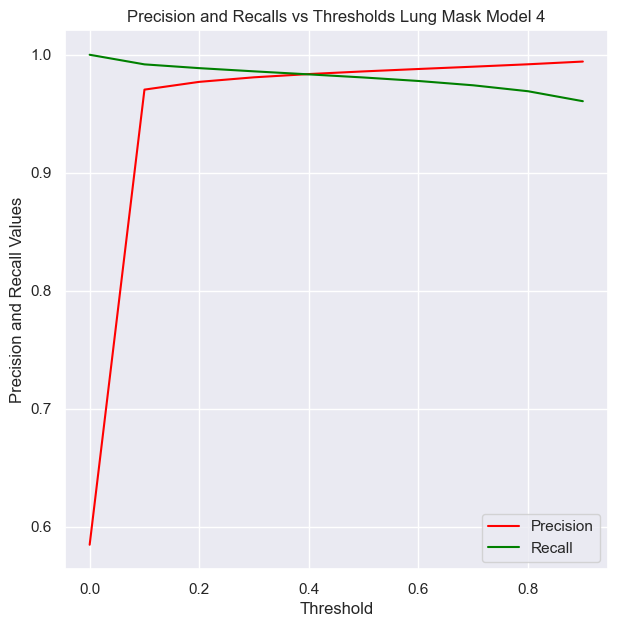

In [119]:
fig = plt.figure(figsize=(7,7))
plt.rcParams["axes.grid"] = True
plt.title("Precision and Recalls vs Thresholds Lung Mask Model 4")
plt.xlabel('Threshold')
plt.ylabel('Precision and Recall Values')
plt.plot(the_prec_rec_range,precisions, color='red')
plt.plot(the_prec_rec_range, recalls, color='green')
plt.legend(['Precision', 'Recall'])
plt.show()
fig.savefig('../output/percision_and_recall_Lungs_model_4.png')

In [117]:
gc.collect()

18099

In [118]:
# Saving model as .h5 file
model_4.save('Lung_Model4.h5')
print("Saving model 4 to disk")

Saving model 4 to disk
